##DIABETES PREDICTION PROJECT

In [1]:
from google.colab import files
uploaded=files.upload()

Saving diabetes2.csv to diabetes2.csv


In [2]:
pip install preprocessing

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 349.6/349.6 kB 12.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 52.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 55.4 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for nltk: filename=nltk-3.2.4-py3-none-any.whl size=1367720 sha256=e1a0e28f5df3e478562b8f81a58251a67260ba371af0f0aef48cdc00160d5e03
  Stored in directory: /root/.cache/pip/wheels/0e/8c/42/bcd0934b61ecf4cef964ccc9881888cca0841ec72266e99de1
Successfully built nltk
  Attempting uninstall: nltk
    Found existing installation: nltk 3.8.1
    Uninstalling nltk-3.8.1:
      Successfully uninstalled nltk-3.8.1


In [3]:
pip install pandas_profiling

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 324.4/324.4 kB 9.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 345.9/345.9 kB 17.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 38.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.5/78.5 kB 4.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 54.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 33.7/33.7 MB 17.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 24.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 24.8 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27096 sha256=41195015e350f97eae1325b9e218381b7c713ba336655c

DATA EXPLORATION

In [4]:
#importing the libr
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import os
%matplotlib inline
import preprocessing
import graphviz
from pandas_profiling import ProfileReport
from plotly.offline import init_notebook_mode, iplot, plot
import plotly as py
init_notebook_mode(connected=True)
import plotly.graph_objs as go
from wordcloud import WordCloud
import warnings
warnings.filterwarnings("ignore")

<ipython-input-4-6bbb9bad11c1>:10: DeprecationWarning: `import pandas_profiling` is going to be deprecated by April 1st. Please use `import ydata_profiling` instead.
  from pandas_profiling import ProfileReport


In [5]:
#importing and reading the dataset
diab_dataset=pd.read_csv('diabetes2.csv')
diab_dataset

,Pregnancies,Glucose,BloodPressure,SkinThickness,Insulin,BMI,DiabetesPedigreeFunction,Age,Outcome
0,6,148,72,35,0,33.6,0.627,50,1
1,1,85,66,29,0,26.6,0.351,31,0
2,8,183,64,0,0,23.3,0.672,32,1
3,1,89,66,23,94,28.1,0.167,21,0
4,0,137,40,35,168,43.1,2.288,33,1
...,...,...,...,...,...,...,...,...,...
763,10,101,76,48,180,32.9,0.171,63,0
764,2,122,70,27,0,36.8,0.340,27,0
765,5,121,72,23,112,26.2,0.245,30,0
766,1,126,60,0,0,30.1,0.349,47,1


In [6]:
#displaying the dimensions of the dataset
diab_dataset.shape

(768, 9)

In [7]:
# Information about the datatypes of the dataset
diab_dataset.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 768 entries, 0 to 767
Data columns (total 9 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Pregnancies               768 non-null    int64  
 1   Glucose                   768 non-null    int64  
 2   BloodPressure             768 non-null    int64  
 3   SkinThickness             768 non-null    int64  
 4   Insulin                   768 non-null    int64  
 5   BMI                       768 non-null    float64
 6   DiabetesPedigreeFunction  768 non-null    float64
 7   Age                       768 non-null    int64  
 8   Outcome                   768 non-null    int64  
dtypes: float64(2), int64(7)
memory usage: 54.1 KB


In [8]:
# Statistical summary
diab_dataset.describe().T

,count,mean,std,min,25%,50%,75%,max
Pregnancies,768.0,3.845052,3.369578,0.000,1.00000,3.0000,6.00000,17.00
Glucose,768.0,120.894531,31.972618,0.000,99.00000,117.0000,140.25000,199.00
BloodPressure,768.0,69.105469,19.355807,0.000,62.00000,72.0000,80.00000,122.00
SkinThickness,768.0,20.536458,15.952218,0.000,0.00000,23.0000,32.00000,99.00
Insulin,768.0,79.799479,115.244002,0.000,0.00000,30.5000,127.25000,846.00
BMI,768.0,31.992578,7.884160,0.000,27.30000,32.0000,36.60000,67.10
DiabetesPedigreeFunction,768.0,0.471876,0.331329,0.078,0.24375,0.3725,0.62625,2.42
Age,768.0,33.240885,11.760232,21.000,24.00000,29.0000,41.00000,81.00
Outcome,768.0,0.348958,0.476951,0.000,0.00000,0.0000,1.00000,1.00


In [9]:
# Count of null values
diab_dataset.isnull().sum()

Pregnancies                 0
Glucose                     0
BloodPressure               0
SkinThickness               0
Insulin                     0
BMI                         0
DiabetesPedigreeFunction    0
Age                         0
Outcome                     0
dtype: int64

OBSERVATIONS:

1. Total number of records and features in the dataset are 768 and 9 respectively.
2. Each feature can be either of float or integer dataype.
3. Features like Blood pressure, BMI, Glucose, Insulin have zero values in the dataset which means there are missing data.
4. There are zero NaN values in the dataset.
5. In the outcome column, 0 represents diabetes negative and 1 represents diabetes positive.

2. DATA VISUALIZATION

<Axes: xlabel='Outcome', ylabel='count'>

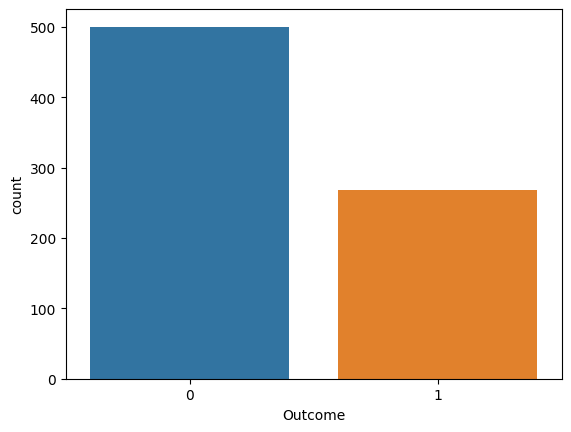

In [10]:
# Count Plot of Outcome Variable
sns.countplot(data = diab_dataset, x = 'Outcome')

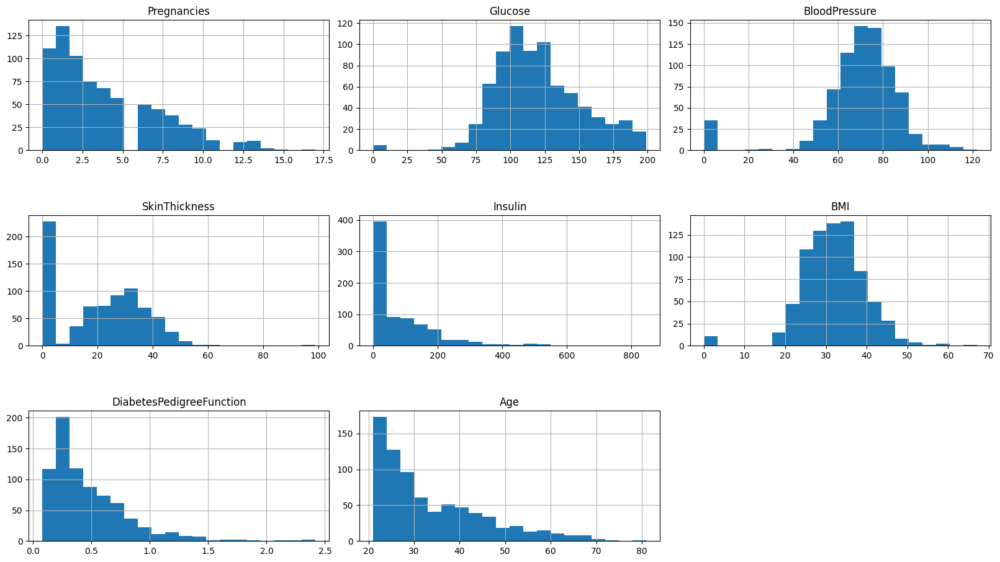

In [11]:
import itertools
import matplotlib.pyplot as plt

# Select the first 8 columns of the diabetes dataset
column_diab = diab_dataset.columns[:8]

# Set the size of the plot
plt.subplots(figsize=(20, 15))

# Get the length of the columns
length = len(column_diab)

# Loop through each column and plot the histogram
for j, k in itertools.zip_longest(column_diab, range(length)):
    # Create a subplot with appropriate dimensions
    plt.subplot((int(length/2)), 3, int(k + 1))
    
    # Adjust the spacing between the subplots
    plt.subplots_adjust(wspace=0.1, hspace=0.5)
    
    # Plot the histogram of the current column with 20 bins
    diab_dataset[j].hist(bins=20)
    
    # Set the title of the subplot to the current column name
    plt.title(j)
    
# Display the plot
plt.show()

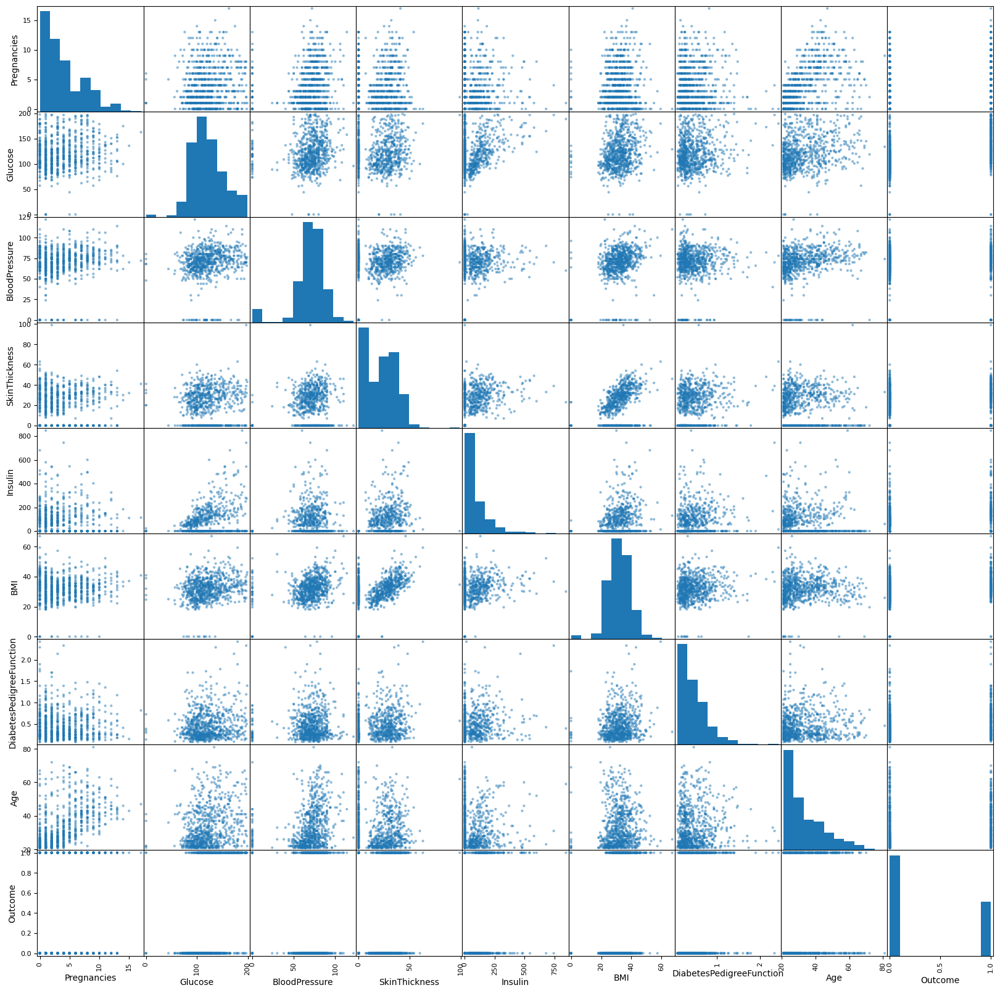

In [12]:
# Scatter matrix 
from pandas.plotting import scatter_matrix
scatter_matrix(diab_dataset, figsize = (20, 20));

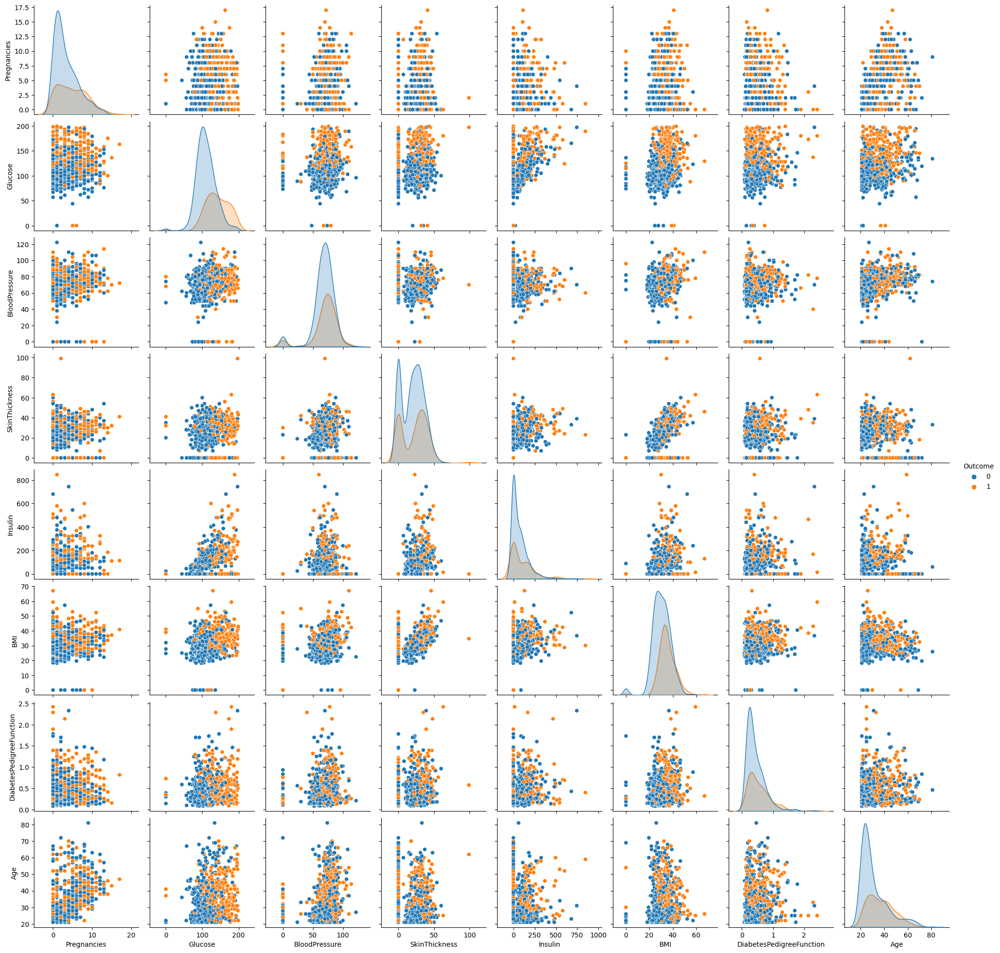

In [13]:
# Pairplot 
sns.pairplot(data = diab_dataset, hue = 'Outcome')
plt.show()

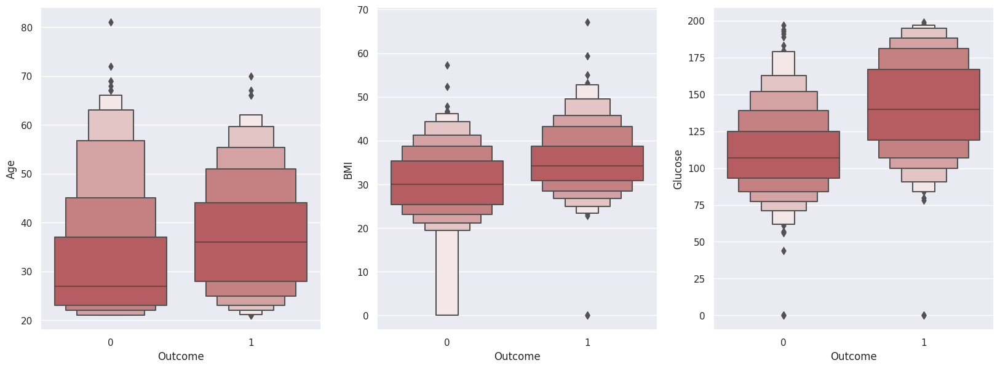

In [14]:
import seaborn as sns
import matplotlib.pyplot as plt

# Set the style of the plot
sns.set_theme(style="darkgrid")

# Set the size of the plot
plt.figure(figsize=(20,15))

# Create the first subplot with Age on the Y axis
plt.subplot(2,3,1)
sns.boxenplot(x=diab_dataset['Outcome'], y=diab_dataset['Age'],
              color="r", 
              scale="linear", data=diab_dataset)

# Create the second subplot with BMI on the Y axis
plt.subplot(2,3,2)
sns.boxenplot(x=diab_dataset['Outcome'], y=diab_dataset['BMI'],
              color="r", 
              scale="linear", data=diab_dataset)

# Create the third subplot with Glucose on the Y axis
plt.subplot(2,3,3)
sns.boxenplot(x=diab_dataset['Outcome'], y=diab_dataset['Glucose'],
              color="r", 
              scale="linear", data=diab_dataset)

# Display the plot
plt.show()

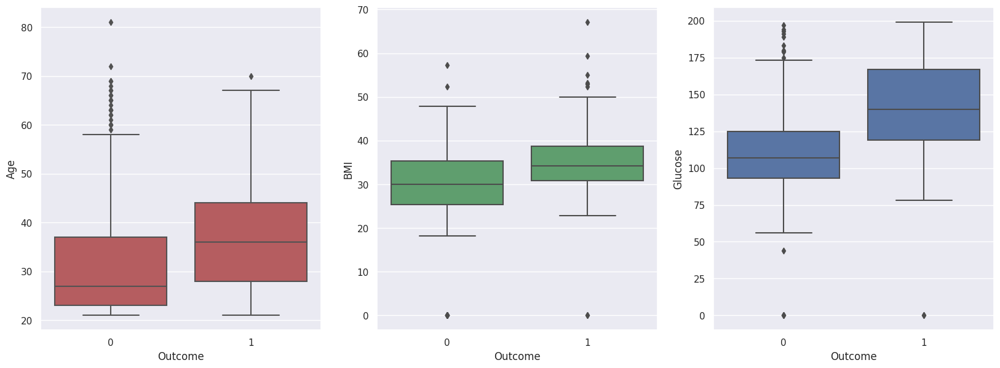

In [15]:
# Set the style of the plot
sns.set_theme(style="darkgrid")

# Set the size of the plot
plt.figure(figsize=(20,15))

# Create the first subplot with Age on the Y axis
plt.subplot(2,3,1)
sns.boxplot(x=diab_dataset['Outcome'], y=diab_dataset['Age'],
              color="r", data=diab_dataset)

# Create the second subplot with BMI on the Y axis
plt.subplot(2,3,2)
sns.boxplot(x=diab_dataset['Outcome'], y=diab_dataset['BMI'],
              color="g", 
              data=diab_dataset)

# Create the third subplot with Glucose on the Y axis
plt.subplot(2,3,3)
sns.boxplot(x=diab_dataset['Outcome'], y=diab_dataset['Glucose'],
              color="b", 
              data=diab_dataset)

# Display the plot
plt.show()

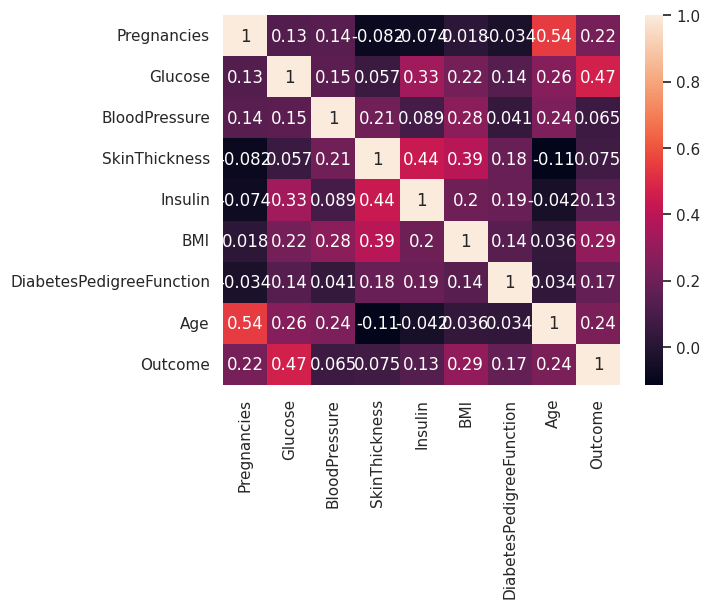

In [16]:
# Displaying the Heatmap
sns.heatmap(diab_dataset.corr(), annot = True)
plt.show()

Observations:
1. The count Plot tells us that the dataset is imbalanced, as number of patients who don't have diabetes is more than those who do.
2. From the correaltion heatmap, we can see that there is a high correlation between Outcome and [Glucose,BMI,Age,Insulin]. We can select these features to accept input from the user and predict the outcome.

PANDAS PROFILING

In [17]:
import pandas_profiling as pp
pp.ProfileReport(diab_dataset)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

3. DATA PROCESSING

In [18]:
# Assign the reference of dataset to dataset_new.
dataset_new = diab_dataset

In [19]:
# Replacing zero values with NaN
dataset_new[["Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI"]] = dataset_new[["Glucose", "BloodPressure", "SkinThickness", "Insulin", "BMI"]].replace(0, pd.np.nan)

In [20]:
# Count of NaN
dataset_new.isnull().sum()

Pregnancies                   0
Glucose                       5
BloodPressure                35
SkinThickness               227
Insulin                     374
BMI                          11
DiabetesPedigreeFunction      0
Age                           0
Outcome                       0
dtype: int64

In [21]:
# Replacing NaN with mean values
dataset_new["Glucose"].fillna(dataset_new["Glucose"].mean(), inplace = True)
dataset_new["BloodPressure"].fillna(dataset_new["BloodPressure"].mean(), inplace = True)
dataset_new["SkinThickness"].fillna(dataset_new["SkinThickness"].mean(), inplace = True)
dataset_new["Insulin"].fillna(dataset_new["Insulin"].mean(), inplace = True)
dataset_new["BMI"].fillna(dataset_new["BMI"].mean(), inplace = True)

MODEL EXPLORATION AND SELECTION

In [22]:
# Feature scaling using MinMaxScaler
from sklearn.preprocessing import MinMaxScaler
diab_scalar = MinMaxScaler(feature_range = (0, 1))
dataset_scaled = diab_scalar.fit_transform(dataset_new)

In [23]:
# Convert the NumPy array dataset_scaled to a Pandas DataFrame and store it in a new variable called dataset_scaled
dataset_scaled = pd.DataFrame(dataset_scaled)

In [24]:
# Selecting features - [Glucose, Insulin, BMI, Age]
X = dataset_scaled.iloc[:, [1, 4, 5, 7]].values
Y = dataset_scaled.iloc[:, 8].values

In [25]:
# Splitting X and Y
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size = 0.20, random_state = 42, stratify = dataset_new['Outcome'] )

#displaying the total number of samples in the whole, training and testing dataset
print(f'Total # of sample in whole dataset: {len(X)}')
print(f'Total # of sample in train dataset: {len(X_train)}')
print(f'Total # of sample in test dataset: {len(X_test)}')

Total # of sample in whole dataset: 768
Total # of sample in train dataset: 614
Total # of sample in test dataset: 154


In [26]:
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, f_classif
from sklearn.feature_selection import SelectFromModel
from sklearn.feature_selection import RFE

from sklearn.model_selection import cross_val_predict
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV, cross_val_score
from sklearn.model_selection import train_test_split

from sklearn import preprocessing
from sklearn.preprocessing import normalize

from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.decomposition import PCA
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

from sklearn.naive_bayes import GaussianNB
from sklearn.naive_bayes import BernoulliNB
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import SGDClassifier, LogisticRegression
from sklearn.svm import SVC
from sklearn.svm import LinearSVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.neural_network import MLPClassifier

from sklearn.metrics import confusion_matrix, accuracy_score
from sklearn.metrics import precision_score, recall_score, f1_score
from sklearn.metrics import classification_report
from sklearn.metrics import roc_auc_score, roc_curve

from xgboost import XGBClassifier, XGBRFClassifier
from xgboost import plot_tree, plot_importance

In [27]:
from sklearn.preprocessing import StandardScaler

In [28]:
sc=StandardScaler()

X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)

In [29]:
#defining the dictionary of Machine Learning Models
models = {
    'GaussianNB': GaussianNB(), #Gaussian Naive Bayes Classifier
    'BernoulliNB': BernoulliNB(), #Bernoulli Naive Bayes Classifier
    'LogisticRegression': LogisticRegression(), #Logistic Regression
    'RandomForestClassifier': RandomForestClassifier(), #Random Forest Classifier
    'SupportVectorMachine': SVC(), #Support Vector Machine Classifier
    'DecisionTreeClassifier': DecisionTreeClassifier(), #Decision Tree Classifier
    'KNeighborsClassifier': KNeighborsClassifier(), #K Nearest Neighbors CLassifier
    'GradientBoostingClassifier': GradientBoostingClassifier(), #Gradient Boosting Classifier
    'Stochastic Gradient Descent':  SGDClassifier(max_iter=5000, random_state=0), #stochastic gradient classifier
    'Neural Nets': MLPClassifier(solver='lbfgs', alpha=1e-5, hidden_layer_sizes=(5000, 10), random_state=1), #Multilayer Perceptron Neural Network Classifier
}

In [30]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report

#Define the names of the models to be evaluated
modelNames = ["GaussianNB", 'BernoulliNB', 'LogisticRegression', 'RandomForestClassifier', 'SupportVectorMachine', 'DecisionTreeClassifier', 'KNeighborsClassifier', 'GradientBoostingClassifier', 'Stochastic Gradient Descent', 'Neural Nets']

#Create empty lists to hold train and test scores
trainScores = []
testScores = []
#Create an empty dictionary to store the results for each model
results = {}

#loop through each model name and fit the model to the training data
for m in models:
    model = models[m]
    model.fit(X_train, y_train)
    
    # Calculate and store the train and test scores
    train_score = model.score(X_train, y_train)
    trainScores.append(train_score*100)

    test_score = model.score(X_test, y_test)
    testScores.append(test_score*100)

    # Generate predictions using the test data and calculate performance metrics
    y_predictions = model.predict(X_test)
    conf_matrix = confusion_matrix(y_predictions, y_test)

    tn = conf_matrix[0,0]
    fp = conf_matrix[0,1]
    tp = conf_matrix[1,1]
    fn = conf_matrix[1,0]
    accuracy  = accuracy_score(y_test, y_predictions)
    precision = precision_score(y_test, y_predictions)
    recall    = recall_score(y_test, y_predictions)
    f1score   = f1_score(y_test, y_predictions)
    specificity = tn / (tn + fp)

    # Generate classification report and store results for this model in the results dictionary
    report = classification_report(y_test, y_predictions, output_dict=True)

    results[m] = {
        'Train Score': train_score,
        'Test Score': test_score,
        'Accuracy': accuracy,
        'Precision': precision,
        'Recall': recall,
        'F1 Score': f1score,
        'Specificity': specificity,
        'Classification Report': report
    }

    # Remove the current model from the list of models to be evaluated
    modelNames.remove(m)

    # Print the results for this model
    print("-------------------------------------------------------------------------------------")
    print(f'{m}') 
    print(f'Train score of trained model: {train_score*100}')
    print(f'Test score of trained model: {test_score*100}')
    print(f'Confusion Matrix: \n{conf_matrix}\n')
    print(f'Accuracy : {accuracy}')
    print(f'Precision: {precision}')
    print(f'Recall   : {recall}')
    print(f'F1 score : {f1score}')
    print(f'Specificity : {specificity}')
    print(f'Classification Report: \n{classification_report(y_test, y_predictions)}\n')
    print("")

-------------------------------------------------------------------------------------
GaussianNB
Train score of trained model: 77.19869706840392
Test score of trained model: 71.42857142857143
Confusion Matrix: 
[[81 25]
 [19 29]]

Accuracy : 0.7142857142857143
Precision: 0.6041666666666666
Recall   : 0.5370370370370371
F1 score : 0.5686274509803922
Specificity : 0.7641509433962265
Classification Report: 
              precision    recall  f1-score   support

         0.0       0.76      0.81      0.79       100
         1.0       0.60      0.54      0.57        54

    accuracy                           0.71       154
   macro avg       0.68      0.67      0.68       154
weighted avg       0.71      0.71      0.71       154



-------------------------------------------------------------------------------------
BernoulliNB
Train score of trained model: 72.9641693811075
Test score of trained model: 71.42857142857143
Confusion Matrix: 
[[80 24]
 [20 30]]

Accuracy : 0.7142857142857143
Pr

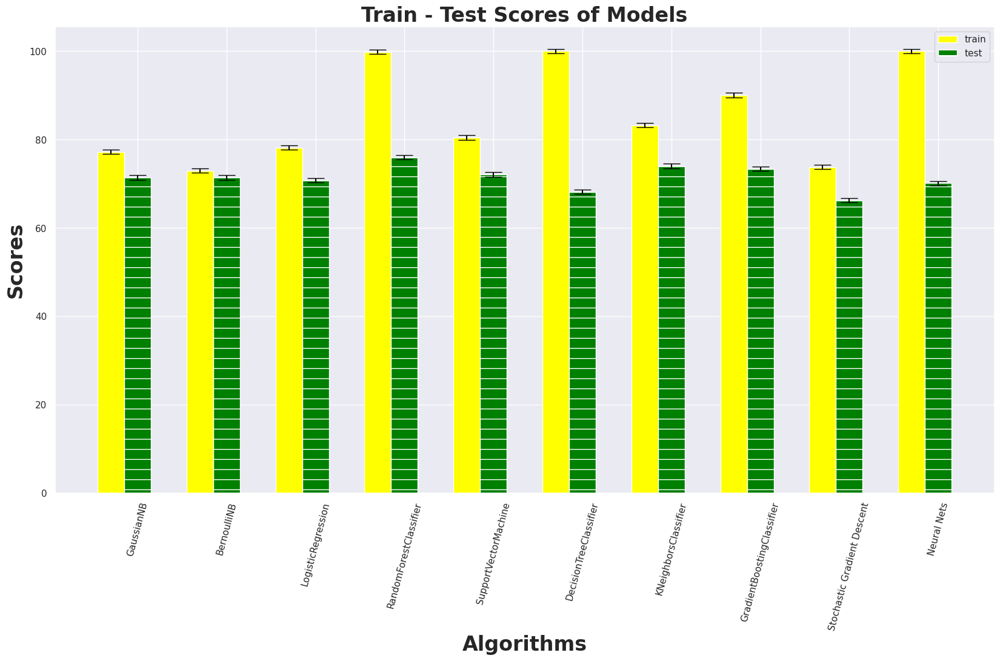

In [31]:
# Import necessary libraries
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
 
# Set figure size and style
plt.figure(figsize=(20,10))
sns.set_style('darkgrid')

# Set the title of the plot
plt.title('Train - Test Scores of Models', fontweight='bold', size = 24)

# Set the width of the bars
barWidth = 0.30
 
# Set the data for train and test scores
bars1 = trainScores
bars2 = testScores
 
# Set the position of the bars on the x-axis
r1 = np.arange(len(bars1))
r2 = [x + barWidth for x in r1]
 
# Plot the bars for train and test scores
plt.bar(r1, bars1, color='yellow', width=barWidth, edgecolor='white', label='train', yerr=0.5,ecolor="black",capsize=10)
plt.bar(r2, bars2, color='green', width=barWidth, edgecolor='white', label='test', yerr=0.5,ecolor="black",capsize=10, hatch = '-')
 
# Set the labels for x and y axis
modelNames = ["GaussianNB", 'BernoulliNB','LogisticRegression','RandomForestClassifier','SupportVectorMachine',
             'DecisionTreeClassifier', 'KNeighborsClassifier','GradientBoostingClassifier',
             'Stochastic Gradient Descent', 'Neural Nets']
plt.xlabel('Algorithms', fontweight='bold', size = 24)
plt.ylabel('Scores', fontweight='bold', size = 24)

# Set the position and label of x-axis ticks
plt.xticks([r + barWidth for r in range(len(bars1))], modelNames, rotation = 75)

# Set the legend
plt.legend()

# Show the plot
plt.show()

In [32]:
for i in range(10):
    print(f'Accuracy of {modelNames[i]} -----> {testScores[i]}')

Accuracy of GaussianNB -----> 71.42857142857143
Accuracy of BernoulliNB -----> 71.42857142857143
Accuracy of LogisticRegression -----> 70.77922077922078
Accuracy of RandomForestClassifier -----> 75.97402597402598
Accuracy of SupportVectorMachine -----> 72.07792207792207
Accuracy of DecisionTreeClassifier -----> 68.18181818181817
Accuracy of KNeighborsClassifier -----> 74.02597402597402
Accuracy of GradientBoostingClassifier -----> 73.37662337662337
Accuracy of Stochastic Gradient Descent -----> 66.23376623376623
Accuracy of Neural Nets -----> 70.12987012987013


The Highest is the "Accuracy of Random Forest Classifier -----> 75.97402597402598
"

PERFORMANCE DIAGNOSTICS AND VISUALIZATION

We evaluated these models according to their accuracies. Best algorithm is KNN with 75.974%. So, we will make k-Fold Cross Validation and Hyper-Parameter Optimization for KNN algorithm

In [33]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)

# Calculate the train score of the trained model on the training set
train_score = rf_model.score(X_train, y_train)
print(f'Train score of trained model: {train_score}')

# Calculate the test score of the trained model on the test set
test_score = rf_model.score(X_test, y_test)
print(f'Test score of trained model: {test_score}')

# Make predictions on the test set
y_predictions = rf_model.predict(X_test)

# Calculate the confusion matrix using the predicted labels and the true labels
conf_matrix = confusion_matrix(y_predictions, y_test)

# Print the accuracy score and confusion matrix
print(f'Accuracy: {accuracy_score(y_predictions, y_test)*100}')
print()
print(f'Confusion matrix: \n{conf_matrix}\n')

Train score of trained model: 1.0
Test score of trained model: 0.7532467532467533
Accuracy: 75.32467532467533

Confusion matrix: 
[[85 23]
 [15 31]]



PERFORMANCE DIAGNOSTICS AND VISUALIZATION

<Axes: >

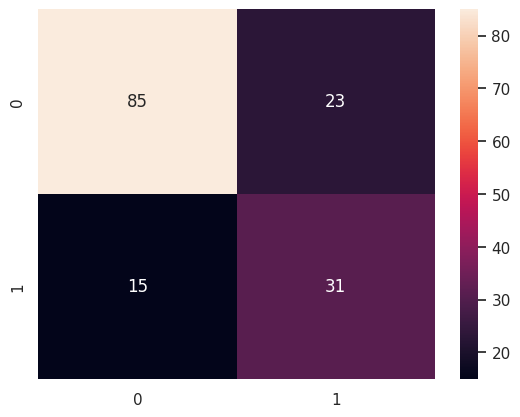

In [34]:
# Heatmap of Confusion matrix
sns.heatmap(pd.DataFrame(conf_matrix), annot=True)

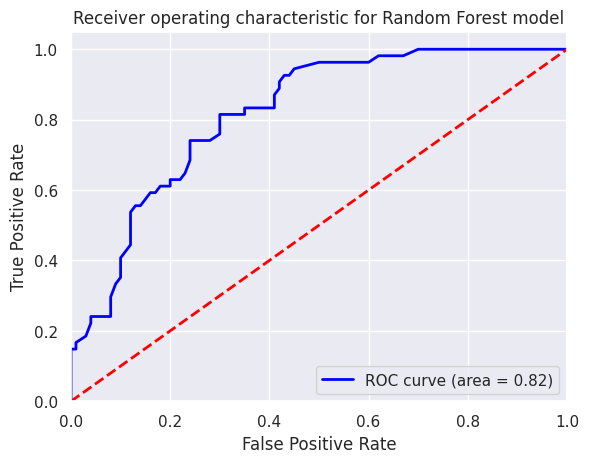

In [35]:
from sklearn.metrics import roc_curve, auc
import matplotlib.pyplot as plt

# predict probabilities for the test set
y_probabilities = rf_model.predict_proba(X_test)[:,1]

# calculate the fpr and tpr for all thresholds of the classification
fpr, tpr, thresholds = roc_curve(y_test, y_probabilities)
roc_auc = auc(fpr, tpr)

# plot the ROC curve
plt.plot(fpr, tpr, color='blue', lw=2, label='ROC curve (area = %0.2f)' % roc_auc)
plt.plot([0, 1], [0, 1], color='red', lw=2, linestyle='--')
plt.xlim([0.0, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic for Random Forest model')
plt.legend(loc="lower right")
plt.show()

Feature Importance Plot - PERFORMANCE DIAGNOSTICS AND VISUALIZATION

In [36]:
diab_dataset.columns

Index(['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
       'BMI', 'DiabetesPedigreeFunction', 'Age', 'Outcome'],
      dtype='object')

In [38]:
# Define features and label
features = ['Pregnancies', 'Glucose', 'BloodPressure', 'SkinThickness', 'Insulin',
            'BMI', 'DiabetesPedigreeFunction', 'Age']
label = ['Outcome']

# Split the dataset into train, validation, and test sets
X = diab_dataset[features]
y = diab_dataset[label]
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=3) 
X_valid, X_test, y_valid, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=2)

# Print the size of each dataset
print(f'Total # of sample in whole dataset: {len(X)}')
print(f'Total # of sample in train dataset: {len(X_train)}')
print(f'Total # of sample in validation dataset: {len(X_valid)}')
print(f'Total # of sample in test dataset: {len(X_test)}')

# Scale the features using StandardScaler
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_valid = scaler.transform(X_valid)
X_test = scaler.transform(X_test)

Total # of sample in whole dataset: 768
Total # of sample in train dataset: 614
Total # of sample in validation dataset: 77
Total # of sample in test dataset: 77


RandomForestClassifier
Old Shape: (768, 8) New shape: (768, 3)




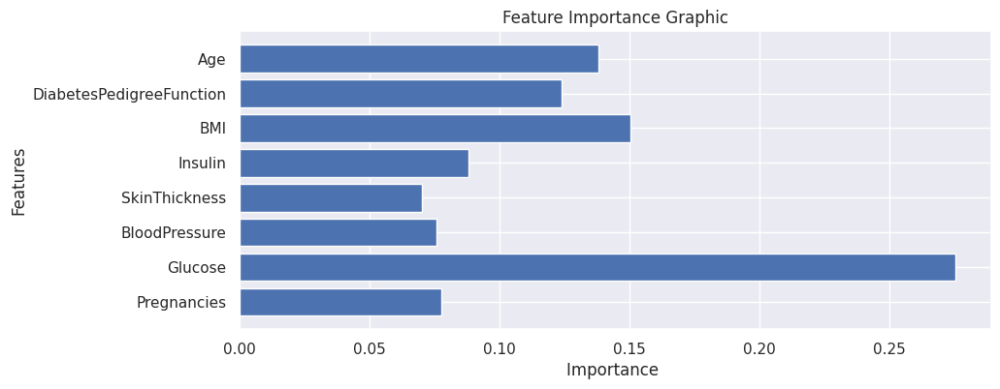

DecisionTreeClassifier
Old Shape: (768, 8) New shape: (768, 3)




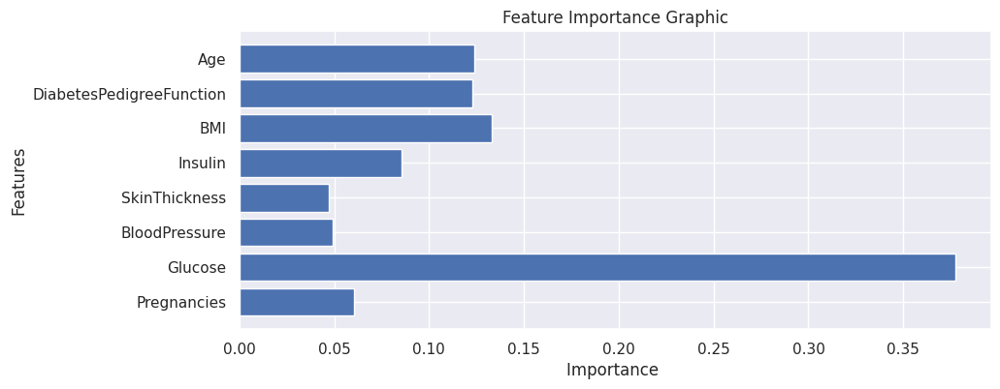

GradientBoostingClassifier
Old Shape: (768, 8) New shape: (768, 3)




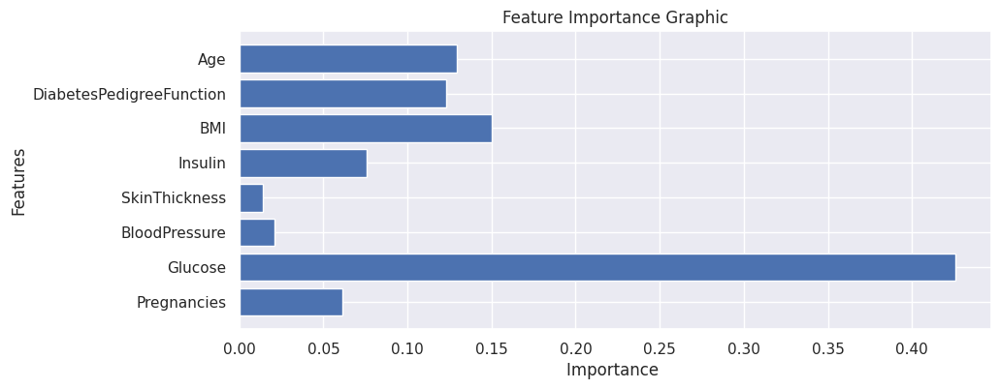

In [39]:
models = {
    'RandomForestClassifier': RandomForestClassifier(),
    'DecisionTreeClassifier': DecisionTreeClassifier(),
    'GradientBoostingClassifier': GradientBoostingClassifier(),
}

for m in models:
    # Fit the model
    model = models[m]
    model.fit(X_train, y_train)

    print(f'{m}')
    # Check if model has feature importances
    if hasattr(model, 'feature_importances_'):
        # Create a SelectFromModel object and fit on X, y
        best_features = SelectFromModel(model)
        best_features.fit(X, y)

        # Transform X to only include important features
        transformedX = best_features.transform(X)
        print(f"Old Shape: {X.shape} New shape: {transformedX.shape}")
        print("\n")

        # Get feature importances and plot them
        imp_feature = pd.DataFrame({'Feature': features, 'Importance': model.feature_importances_})
        plt.figure(figsize=(10,4))
        plt.title("Feature Importance Graphic")
        plt.xlabel("Importance ")
        plt.ylabel("Features")
        plt.barh(imp_feature['Feature'], imp_feature['Importance'])
        plt.show()
    else:
        print(f"Cannot apply SelectFromModel to {m}")

In [40]:
from sklearn.feature_selection import SelectFromModel
from sklearn.naive_bayes import BernoulliNB
from sklearn.linear_model import LogisticRegression, SGDClassifier

# Define the models to be used
models = {
    'BernoulliNB': BernoulliNB(),
    'LogisticRegression': LogisticRegression(),
    'Stochastic Gradient Descent': SGDClassifier(max_iter=5000, random_state=0),
}

# Iterate through the models
for m in models:
    model = models[m]
    model.fit(X_train, y_train)
    
    print(f'{m}')
    
    # Check if the model has a 'coef_' attribute which is required by SelectFromModel
    if hasattr(model, 'coef_'):
        # Use SelectFromModel to select the best features based on the model's coefficients
        best_features = SelectFromModel(model)
        best_features.fit(X_train, y_train)

        # Transform the training data to include only the best features
        X_train_transformed = best_features.transform(X_train)
        print(f"Old Shape: {X_train.shape} New shape: {X_train_transformed.shape}")
        print("\n")
    else:
        print(f"Cannot apply SelectFromModel to {m}")

BernoulliNB
Cannot apply SelectFromModel to BernoulliNB
LogisticRegression
Old Shape: (614, 8) New shape: (614, 3)


Stochastic Gradient Descent
Old Shape: (614, 8) New shape: (614, 4)


